In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
%matplotlib inline
%config IPython.matplotlib.backend = "retina"
from matplotlib import rcParams
from matplotlib import lines as mlines
from matplotlib import ticker
rcParams["savefig.dpi"] = 300
rcParams["figure.dpi"] = 300

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette(sns.color_palette("colorblind"))
sns_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
sns_hex = list(sns.color_palette("colorblind").as_hex())
import json, os, pickle, glob
import tqdm
import corner
import scipy.linalg as sl
import logging
logger = logging.getLogger(__name__)

In [10]:
from scipy.linalg import LinAlgError
import la_forge.diagnostics as dg
import la_forge.core as co
from la_forge.rednoise import gorilla_bf
from la_forge.utils import epoch_ave_resid
from h5pulsar import FilePulsar
from enterprise.signals.utils import ConditionalGP
#from la_forge.gp import Signal_Reconstruction
from enterprise.signals import parameter, signal_base, utils, gp_signals, selections
from enterprise_extensions import chromatic as chrom
import enterprise.constants as const
from enterprise_extensions.empirical_distr import EmpiricalDistribution1D, EmpiricalDistribution2D
from collections import OrderedDict
DM_K = float(2.41e-4)

In [11]:
from IPTA_DR2_analysis.model_blocks import adv_noise_block

In [12]:
from dr3_noise import post_processing_utils as ppu
from dr3_noise import plot_utils as pu
from dr3_noise.models import model_singlepsr_noise

# Load PTA datasets - compare lite and full properties

In [45]:
project_path = '/vast/palmer/home.grace/bbl29/IPTA_DR2_analysis'
datasets = ['single-PTA', 'combined']
figsave = f'{project_path}/figs/dataset_comparisons/data'
ptas = ['EPTA', 'NANOGrav', 'PPTA']

In [46]:
psrs = {'single-PTA':[], 'combined':[], 'edr2':[]}
psr_paths = np.sort(glob.glob(f'{project_path}/data/full_ePSRs/J*'))
for psr_path in psr_paths:
    with open(psr_path,'rb') as f:
        psrs['combined'].append(FilePulsar(f))
psr_paths = np.sort(glob.glob(f'{project_path}/data/edr2_ePSRs/J*'))
for psr_path in psr_paths:
    with open(psr_path,'rb') as f:
        psrs['edr2'].append(FilePulsar(f))
psr_paths = np.sort(glob.glob(f'{project_path}/data/lite_unfiltered_53_ePSRs/J*'))
for psr_path in psr_paths:
    with open(psr_path,'rb') as f:
        psrs['single-PTA'].append(pickle.load(f))

In [47]:
psrnames = [p.name for p in psrs['combined']]
Npsrs = len(psrnames)
Npsrs

53

In [48]:
edr2_psrnames = [p.name for p in psrs['edr2']]
len(edr2_psrnames)

22

In [17]:
# opacity adjustments
beta = dict.fromkeys(psrnames)
for psrname in beta:
    beta[psrname] = {'EPTA':1,'NANOGrav':1,'PPTA':1}
beta['J0437-4715']['PPTA'] = 0.05 # good
beta['J0613-0200']['NANOGrav'] = 0.02 # good
beta['J0621+1002']['EPTA'] = 0.3 # good # good
beta['J1012+5307']['NANOGrav'] = 0.02 # good
beta['J1012+5307']['EPTA'] = 0.1 # good
beta['J1024-0719']['NANOGrav'] = 0.02 # good
beta['J1600-3053']['NANOGrav'] = 0.02 # good
beta['J1643-1224']['NANOGrav'] = 0.02 # good
beta['J1713+0747']['NANOGrav'] = 0.02 # good # set to 0.5 pre-MJD 53200
beta['J1744-1134']['NANOGrav'] = 0.02 # good
beta['J1857+0943']['NANOGrav'] = 0.5 # good
beta['J1909-3744']['NANOGrav'] = 0.02 # good
beta['J1939+2134']['NANOGrav'] = 0.02 # set to 0. pre-MJD 52000
beta['J1939+2134']['EPTA'] = 0.5
beta['J2145-0750']['NANOGrav'] = 0.02 # good
beta['J2317+1439']['EPTA'] = 0.3 # good

In [18]:
ptas

['EPTA', 'NANOGrav', 'PPTA']

In [19]:
53/5

10.6

In [21]:
markers = ['o', 's', '^']
mint_lc = np.min([psr.toas.min() for psr in psrs['combined']])/const.day
maxt_lc = np.max([psr.toas.max() for psr in psrs['combined']])/const.day
mint_lite = np.min([psr.toas.min() for psr in psrs['single-PTA']])/const.day
maxt_lite = np.max([psr.toas.max() for psr in psrs['single-PTA']])/const.day
Npsrs = len(psrnames)
Npsrs

53

In [104]:
nrows = 11
ncols = 5
markers = ['o', 's', '^']
mint_lc = np.min([psr.toas.min() for psr in psrs['combined']])/const.day
maxt_lc = np.max([psr.toas.max() for psr in psrs['combined']])/const.day
minnu_lc = np.min([psr.freqs.min() for psr in psrs['combined']])/1e3
maxnu_lc = np.max([psr.freqs.max() for psr in psrs['combined']])/1e3
mint_lite = np.min([psr.toas.min() for psr in psrs['single-PTA']])/const.day
maxt_lite = np.max([psr.toas.max() for psr in psrs['single-PTA']])/const.day
Npsrs = len(psrnames)
fig, axes = plt.subplots(nrows, ncols, figsize=(15*nrows/7,7*ncols/3), dpi=600, sharey=True)
axes = np.array(axes).flatten()
for idx, psrname in enumerate(psrnames):
    ax = axes[idx]
    if psrname in edr2_psrnames:
        # add gold shading
        ax.fill_between([mint_lc, maxt_lc], maxnu_lc, minnu_lc, color='#FFD700', alpha=0.2)
        ax.set_xlim([mint_lc, maxt_lc])
        ax.set_ylim([minnu_lc, maxnu_lc])
    psr = [p for p in psrs['combined'] if p.name == psrname][0]
    psrlite = [p for p in psrs['single-PTA'] if p.name == psrname][0]
    ax.scatter(psr.toas/const.day, psr.freqs/1e3,
               color='k', alpha=1, s=20, marker='.')
    for i, pta in enumerate(ptas):
        if pta in psrlite.flags['pta']:
            ax.scatter(psrlite.toas/const.day, psrlite.freqs/1e3, color=f'C{i}', alpha=1,
                       label=f'PSR {psrname.replace("-",r"$-$")} | {pta}', edgecolor=None,
                       lw=0.3, s=20, marker=markers[i])
    ax.legend(loc='upper left', frameon=True)
    ax.axvline(mint_lite, color='r', alpha=1, lw=0.6, ls='-')
    ax.axvline(maxt_lite, color='r', alpha=1, lw=0.6, ls='-')
    ax.axvline(psrlite.toas.min()/const.day, color='k', alpha=1, lw=1, ls='--')
    ax.axvline(psrlite.toas.max()/const.day, color='k', alpha=1, lw=1, ls='--')
    ax.axvline(psr.toas.min()/const.day, color='k', alpha=0.3, lw=1, ls='--')
    ax.axvline(psr.toas.max()/const.day, color='k', alpha=0.3, lw=1, ls='--')
    if idx % ncols == 0:
        ax.set_ylabel(r'$\nu$ (GHz)')
    ax.set_xlim([mint_lc, maxt_lc])
    #plt.title(psrname)
#fig.delaxes(axes[-1])
#axes[-2].set_xlim([mint_lc, maxt_lc])
axes[-3].set_xlabel('MJD', fontsize='large')
axes[-4].set_xlabel('MJD', fontsize='large')
axes[-5].set_xlabel('MJD', fontsize='large')
axes[-6].set_xlabel('MJD', fontsize='large')
axes[-7].set_xlabel('MJD', fontsize='large')
axes[-1].remove()
axes[-2].remove()

#axes.get_shared_x_axes().remove(axes[-3])
#axes[-3].set_xticks([46000, 48000, 50000, 52000, 54000, 56000, 58000])
#axes[-3].set_xticklabels(['46000', '48000', '50000', '52000', '54000', '56000', '58000'])
#axes[-3].xaxis.set_visible(True)
#plt.label_outer()
fig.tight_layout()
fig.subplots_adjust(hspace=0, wspace=0)
fig.savefig(f'{figsave}/compare_toas_53.png', dpi=600, bbox_inches='tight')
plt.show()

In [17]:
nrows = 14
ncols = 4
markers = ['o', 's', '^']
mint_lc = np.min([psr.toas.min() for psr in psrs['combined']])/const.day
maxt_lc = np.max([psr.toas.max() for psr in psrs['combined']])/const.day
minnu_lc = np.min([psr.freqs.min() for psr in psrs['combined']])/1e3
maxnu_lc = np.max([psr.freqs.max() for psr in psrs['combined']])/1e3
mint_lite = np.min([psr.toas.min() for psr in psrs['single-PTA']])/const.day
maxt_lite = np.max([psr.toas.max() for psr in psrs['single-PTA']])/const.day
Npsrs = len(psrnames)
fig, axes = plt.subplots(nrows, ncols, figsize=(33/7*ncols,nrows), dpi=600, sharey=True)
axes = np.array(axes).flatten()
for idx, psrname in enumerate(psrnames):
    ax = axes[idx]
    if psrname in edr2_psrnames:
        # add gold shading
        ax.fill_between([mint_lc, maxt_lc], maxnu_lc, minnu_lc, color='#FFD700', alpha=0.2)
        ax.set_xlim([mint_lc, maxt_lc])
        ax.set_ylim([minnu_lc, maxnu_lc])
    psr = [p for p in psrs['combined'] if p.name == psrname][0]
    psrlite = [p for p in psrs['single-PTA'] if p.name == psrname][0]
    ax.scatter(psr.toas/const.day, psr.freqs/1e3,
               color='k', alpha=1, s=20, marker='.')
    for i, pta in enumerate(ptas):
        if pta in psrlite.flags['pta']:
            ax.scatter(psrlite.toas/const.day, psrlite.freqs/1e3, color=f'C{i}', alpha=1,
                       label=f'PSR {psrname.replace("-",r"$-$")} | {pta}', edgecolor=None,
                       lw=0.3, s=20, marker=markers[i])
    ax.legend(loc='upper left', frameon=True)
    ax.axvline(mint_lite, color='r', alpha=1, lw=0.6, ls='-')
    ax.axvline(maxt_lite, color='r', alpha=1, lw=0.6, ls='-')
    ax.axvline(psrlite.toas.min()/const.day, color='k', alpha=1, lw=1, ls='--')
    ax.axvline(psrlite.toas.max()/const.day, color='k', alpha=1, lw=1, ls='--')
    ax.axvline(psr.toas.min()/const.day, color='k', alpha=0.3, lw=1, ls='--')
    ax.axvline(psr.toas.max()/const.day, color='k', alpha=0.3, lw=1, ls='--')
    if idx % ncols == 0:
        ax.set_ylabel(r'$\nu$ (GHz)')
    ax.set_xlim([mint_lc, maxt_lc])
    #plt.title(psrname)
#fig.delaxes(axes[-1])
#axes[-2].set_xlim([mint_lc, maxt_lc])
axes[-4].set_xlabel('MJD', fontsize='large')
axes[-5].set_xlabel('MJD', fontsize='large')
axes[-6].set_xlabel('MJD', fontsize='large')
axes[-7].set_xlabel('MJD', fontsize='large')
#axes[-7].set_xlabel('MJD', fontsize='large')
axes[-1].remove()
axes[-2].remove()
axes[-3].remove()

#axes.get_shared_x_axes().remove(axes[-3])
#axes[-3].set_xticks([46000, 48000, 50000, 52000, 54000, 56000, 58000])
#axes[-3].set_xticklabels(['46000', '48000', '50000', '52000', '54000', '56000', '58000'])
#axes[-3].xaxis.set_visible(True)
#plt.label_outer()
fig.tight_layout()
fig.subplots_adjust(hspace=0, wspace=0)
fig.savefig(f'{figsave}/compare_toas_53_long.png', dpi=600, bbox_inches='tight')
plt.show()

In [21]:
(maxt_lc - mint_lc)*const.day/const.yr

30.19071113233252

In [19]:
ptas = np.array([psr.flags['pta'][0] for psr in psrs['single-PTA']])
print(np.count_nonzero([ptas == 'EPTA']))
print(np.count_nonzero([ptas == 'NANOGrav']))
print(np.count_nonzero([ptas == 'PPTA']))

33
8
12


In [142]:
T = (maxt_lite - mint_lite)/const.yr*const.day
Tspans = [(psr.toas.max() - psr.toas.min())/const.yr for psr in psrs['single-PTA']]
Tspans_combined = [(psr.toas.max() - psr.toas.min())/const.yr for psr in psrs['combined']]
Tspans_edr2 = [(psr.toas.max() - psr.toas.min())/const.yr for psr in psrs['edr2']]
T

30.19071113233252

In [181]:
np.count_nonzero(np.array(Tspans_combined) > 7.5)

41

In [180]:
np.array(psrnames)[np.array(Tspans_combined) > 21]

array(['J1713+0747', 'J1857+0943', 'J1939+2134'], dtype='<U11')

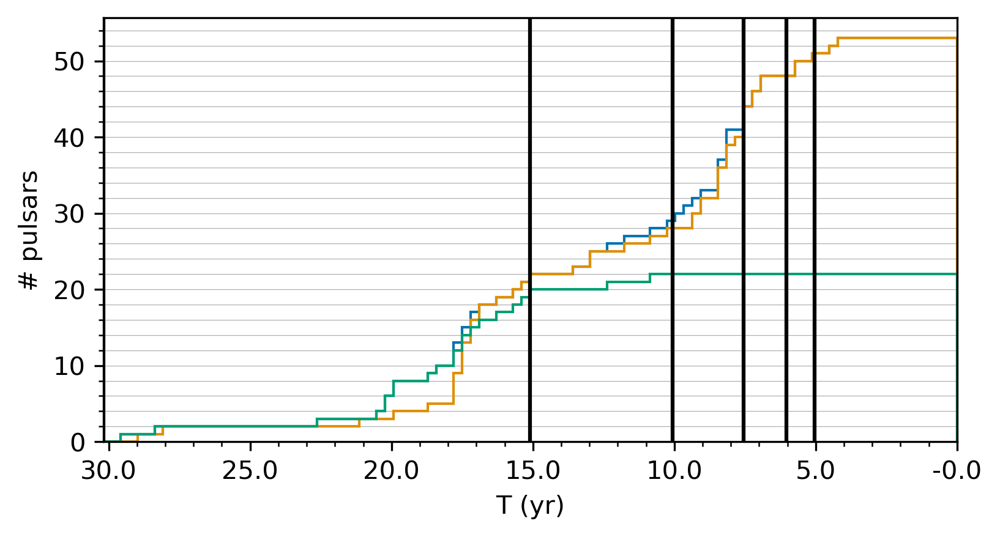

In [168]:
#plt.rcdefaults()
fig, ax = plt.subplots(figsize=(6,3))
ax.hist(-np.array(Tspans_combined), bins=100, cumulative=True, range=(-T,0), histtype='step')
ax.hist(-np.array(Tspans), bins=100, cumulative=True, range=(-T,0), histtype='step')
ax.hist(-np.array(Tspans_edr2), bins=100, cumulative=True, range=(-T,0), histtype='step')
ax.set_xlabel('T (yr)')
ax.set_ylabel('# pulsars')
ax.set_xlim([-T,0])
for Tspan in [-T,-T/2,-T/3,-T/4,-T/5,-T/6]:
    ax.axvline(Tspan, color='k')
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x,pos: -x))
ax.minorticks_on()
ax.grid(which='both', axis='y',lw=0.3)
fig.savefig(f'{figsave}/Tspans.png', dpi=300, bbox_inches='tight')
plt.show()

In [146]:
# histogram of all TOAs
all_toas_lite = np.concatenate([psr.toas for psr in psrs['single-PTA']])
all_toas_full = np.concatenate([psr.toas for psr in psrs['combined']])
all_toas_edr2 = np.concatenate([psr.toas for psr in psrs['edr2']])
len(all_toas_lite), len(all_toas_full), len(all_toas_edr2)

(59647, 184440, 132305)

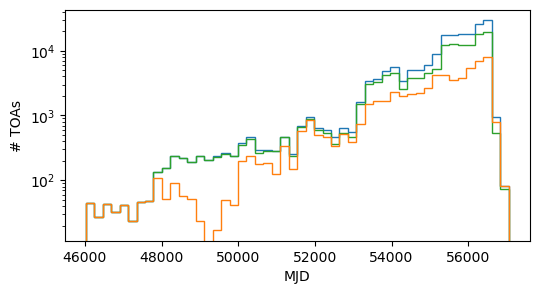

In [158]:
fig, ax = plt.subplots(figsize=(6,3))
ax.hist(all_toas_full/const.day, bins=50, histtype='step', zorder=0)
ax.hist(all_toas_lite/const.day, bins=50, histtype='step', zorder=2)
ax.hist(all_toas_edr2/const.day, bins=50, histtype='step', zorder=1)
ax.set_xlabel('MJD')
ax.set_ylabel('# TOAs')
ax.semilogy()
fig.savefig(f'{figsave}/TOA_dist.png', dpi=300, bbox_inches='tight')
plt.show()

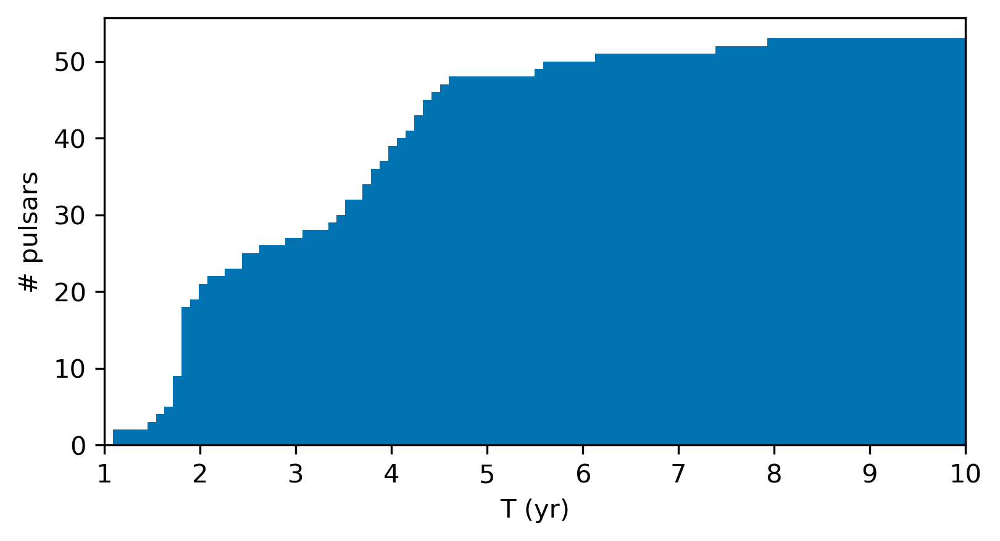

In [135]:
fig, ax = plt.subplots(figsize=(6,3))
ax.hist(1e9*1/np.array(Tspans)/const.yr, bins=100, cumulative=True, range=(1,10))#, range=(-T,0))
ax.set_xlabel('T (yr)')
ax.set_ylabel('# pulsars')
ax.set_xlim([1,10])
#for Tspan in [-T,-T/2,-T/3,-T/4,-T/5,-T/6]:
#    ax.axvline(Tspan, color='k')
#ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x,pos: -x))
plt.show()

# Make a plot of the FoM

- Load the FoMs from the individual PTAs and the combined data.
- Sort the pulsars by the order which has the highest FoM in Lite
- Plot the uncombined and combined FoMs on the same plot

In [54]:
lite_dict_file = f'{project_path}/FoM_output/FoM_inter_gwb_3yrcut_unfiltered_dict.json'
with open(lite_dict_file, 'r') as fin:
    FoM_dict = json.load(fin)
combined_dict_file = f'{project_path}/FoM_output/FoM_combined_dict.json'
with open(combined_dict_file, 'r') as fin:
    FoM_combined_dict = json.load(fin)

In [55]:
FoM_dict.keys()

dict_keys(['J0023+0923', 'J0030+0451', 'J0034-0534', 'J0218+4232', 'J0340+4130', 'J0437-4715', 'J0610-2100', 'J0613-0200', 'J0621+1002', 'J0645+5158', 'J0711-6830', 'J0751+1807', 'J0900-3144', 'J0931-1902', 'J1012+5307', 'J1022+1001', 'J1024-0719', 'J1045-4509', 'J1455-3330', 'J1600-3053', 'J1603-7202', 'J1614-2230', 'J1640+2224', 'J1643-1224', 'J1713+0747', 'J1721-2457', 'J1730-2304', 'J1732-5049', 'J1738+0333', 'J1741+1351', 'J1744-1134', 'J1747-4036', 'J1751-2857', 'J1801-1417', 'J1802-2124', 'J1804-2717', 'J1824-2452A', 'J1832-0836', 'J1843-1113', 'J1853+1303', 'J1857+0943', 'J1903+0327', 'J1909-3744', 'J1910+1256', 'J1911+1347', 'J1911-1114', 'J1918-0642', 'J1923+2515', 'J1939+2134', 'J1944+0907', 'J1949+3106', 'J1955+2908', 'J2010-1323', 'J2017+0603', 'J2019+2425', 'J2033+1734', 'J2043+1711', 'J2124-3358', 'J2129-5721', 'J2145-0750', 'J2214+3000', 'J2229+2643', 'J2302+4442', 'J2317+1439', 'J2322+2057'])

In [56]:
# rank the FoM:
sorted_FoM = dict(sorted(FoM_dict.items(), key=lambda item: np.max([item[1][pta]['FoM'] for pta in item[1]])))
for psrname in list(sorted_FoM.keys()):
    if not psrname in psrnames:
        sorted_FoM.pop(psrname)
        FoM_combined_dict.pop(psrname)
sorted_FoM

{'J2033+1734': {'EPTA': {'FoM': 1.0947256949284083,
   'Tobs': 7.916094679306584,
   'dt': 15.298167098501215,
   'sigma': 15.280271536330925}},
 'J1903+0327': {'NANOGrav': {'FoM': 1.1343505476384148,
   'Tobs': 3.9862904050712014,
   'dt': 38.315593959269904,
   'sigma': 1.8720035785134024}},
 'J2019+2425': {'EPTA': {'FoM': 1.169602801804967,
   'Tobs': 9.136594549572465,
   'dt': 26.485247295486847,
   'sigma': 11.89499731801973}},
 'J1944+0907': {'NANOGrav': {'FoM': 1.2856273882126097,
   'Tobs': 5.712007391563773,
   'dt': 43.46480624518059,
   'sigma': 2.227449872200163}},
 'J1955+2908': {'EPTA': {'FoM': 1.255739758882966,
   'Tobs': 8.125633295211532,
   'dt': 19.78591707384008,
   'sigma': 7.845381866233881},
  'NANOGrav': {'FoM': 1.3364666598918127,
   'Tobs': 7.246477532613073,
   'dt': 51.897567035037746,
   'sigma': 2.8854684692717263}},
 'J2322+2057': {'EPTA': {'FoM': 1.3695368564174406,
   'Tobs': 7.894209350007983,
   'dt': 13.730285548049597,
   'sigma': 6.07448497488817

In [57]:
sorted_combined_FoM = dict(sorted(FoM_combined_dict.items(), key=lambda item: item[1]['FoM']))

In [58]:
print(f'Here are the top 21 pulsars:')
for psrname, psrname2 in zip(list(sorted_FoM.keys())[-21:], list(sorted_combined_FoM.keys())[-21:]):
    print(psrname, psrname2)

Here are the top 21 pulsars:
J2124-3358 J0751+1807
J0030+0451 J1603-7202
J2129-5721 J0711-6830
J1640+2224 J1024-0719
J0751+1807 J2124-3358
J1603-7202 J0030+0451
J0711-6830 J1012+5307
J1730-2304 J1600-3053
J1024-0719 J1730-2304
J1600-3053 J1022+1001
J0613-0200 J1643-1224
J1022+1001 J0613-0200
J1643-1224 J2145-0750
J1012+5307 J2317+1439
J2145-0750 J1640+2224
J1857+0943 J1909-3744
J1744-1134 J1744-1134
J1909-3744 J1857+0943
J1713+0747 J1713+0747
J0437-4715 J0437-4715
J1939+2134 J1939+2134


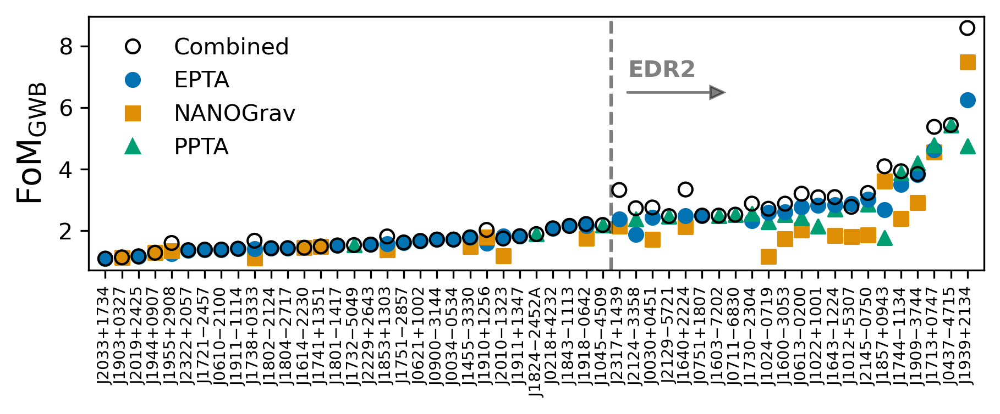

In [62]:
psr_labels = [p.replace('-',r'$-$') for p in list(sorted_FoM.keys())]
fig, ax = plt.subplots(figsize=(7,2))
for i, psrname in enumerate(sorted_FoM):
    FoM_pta_order = dict(sorted(sorted_FoM[psrname].items(), key=lambda item: item[1]['FoM']))
    for pta in FoM_pta_order:
        if pta == 'NANOGrav':
            color = 'C1'
            marker = 's'
        elif pta == 'EPTA':
            color = 'C0'
            marker = 'o'
        else:
            color = 'C2'
            marker = '^'
        ax.scatter([i], FoM_pta_order[pta]['FoM'], fc=color, lw=1, marker=marker)
    ax.scatter([i], FoM_combined_dict[psrname]['FoM'], fc='none', ec='k', lw=1)
ax.set_xticks(np.arange(53))
ax.set_xticklabels(psr_labels, rotation=90, fontsize='x-small')
ax.set_ylabel(r'$\mathrm{FoM}_{\mathrm{GWB}}$', fontsize='x-large')
ax.set_xlim([-1,53])
handles = [mlines.Line2D([],[],marker='o',ls='none',markerfacecolor='none',
                         markeredgecolor='k',lw=1,label='Combined')]
handles += [mlines.Line2D([],[],marker='o',ls='none',color='C0',label='EPTA')]
handles += [mlines.Line2D([],[],marker='s',ls='none',color='C1',label='NANOGrav')]
handles += [mlines.Line2D([],[],marker='^',ls='none',color='C2',label='PPTA')]
ax.axvline(53-22-0.5, color='k', ls='--', alpha=0.5)
ax.text(53-22+0.5, 7, 'EDR2', fontsize='medium', alpha=0.5, fontweight='bold')
ax.arrow(53-22+0.5, 6.5, 5, 0, color='k', alpha=0.5, head_width=0.4, head_length=0.8)
ax.legend(handles=handles, frameon=False)
fig.savefig(f'{figsave}/FoM.png', dpi=600, bbox_inches='tight')
plt.show()

# Make a table of dataset properties

We'd like to record the following for each pulsar in lite. Here is the list of columns
- PSR name
- Favored PTA
- Tspan (years)
- FoM (weak scaling)
------------------
Optional additional columns:
- Effective frequency bandwidth (MHz)
- Lowest frequency (nHz)
- Effective frequency bandwidth (MHz)
- Degeneracy factor? (Ferranti+2024)

Additional columns for full DR2:
- Tspan (years)
- FoM (weak scaling)
- Effective frequency bandwidth (MHz)

In [35]:
from enterprise.signals import utils

In [36]:
def gwb_FoM_weak(Tobs, dt, TOAerr):
    """GWB FoM from SNR scaling laws
    """
    return Tobs**(13/3) / TOAerr**2 / dt 

def gwb_FoM_inter(Tobs, dt, TOAerr):
    """GWB FoM from SNR scaling laws
    """
    return Tobs**(1/2) * (TOAerr**2 * dt) ** (-1/(2*13/3)) 

In [100]:
table = ''
for psr in psrs['single-PTA']:
    line = []
    # name
    line.append(psr.name)
    # PTA
    line.append(psr.flags['pta'][0])
    # Tspan
    Tspan = (psr.toas.max() - psr.toas.min())/const.yr
    line.append(Tspan)
    # FoM
    U, _ = utils.create_quantization_matrix(psr.toas, dt=const.day, nmin=1)
    dt = (psr.toas.max() - psr.toas.min()) / U.shape[1] / const.day # mean dt
    sigma = 1 / np.mean(1/psr.toaerrs[idx])  # harmonic mean TOAerr
    FoM = gwb_FoM_inter(Tspan, dt, sigma)
    line.append(FoM)
    print(line)
    print(dt, sigma)
    break

['J0030+0451', 'NANOGrav', 8.77280668218287, 40.71403856232303]
53.404460677788215 1.6e-06


In [97]:
const.day

86400.0

In [96]:
dt/const.day, sigma

(21.650457031535762, 1.6e-06)

In [ ]:
  'NANOGrav': {'FoM': 1.7276258377537923,
   'Tobs': 8.772806682182862,
   'dt': 53.40446067778817,
   'sigma': 1.4149120740401786}}

# Load PTA datasets - compare lite-filtered and lite-combined properties

Old version of plot - may still use in section 5

In [22]:
project_path = '/vast/palmer/home.grace/bbl29/IPTA_DR2_analysis'
datasets = ['single-PTA', 'combined']
figsave = f'{project_path}/figs/dataset_comparisons/data'
ptas = ['EPTA', 'NANOGrav', 'PPTA']

In [23]:
sns.color_palette()

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [24]:
psrs = {'single-PTA':[], 'combined':[]}
psr_paths = np.sort(glob.glob(f'{project_path}/data/litec_ePSRs/J*'))
for psr_path in psr_paths:
    with open(psr_path,'rb') as f:
        psrs['combined'].append(FilePulsar(f))
lite_psrs = []
psr_paths = np.sort(glob.glob(f'{project_path}/data/lite_ePSRs/J*'))
for psr_path in psr_paths:
    with open(psr_path,'rb') as f:
        psrs['single-PTA'].append(FilePulsar(f))

In [25]:
psrnames = [p.name for p in psrs['single-PTA']]
psrnames

['J0030+0451',
 'J0034-0534',
 'J0218+4232',
 'J0437-4715',
 'J0613-0200',
 'J0621+1002',
 'J1012+5307',
 'J1022+1001',
 'J1024-0719',
 'J1455-3330',
 'J1600-3053',
 'J1640+2224',
 'J1643-1224',
 'J1713+0747',
 'J1744-1134',
 'J1857+0943',
 'J1909-3744',
 'J1918-0642',
 'J1939+2134',
 'J2145-0750',
 'J2317+1439']

In [26]:
Npsrs = len(psrnames)
Npsrs

21

In [27]:
# opacity adjustments
beta = dict.fromkeys(psrnames)
for psrname in beta:
    beta[psrname] = {'EPTA':1,'NANOGrav':1,'PPTA':1}
beta['J0437-4715']['PPTA'] = 0.05 # good
beta['J0613-0200']['NANOGrav'] = 0.02 # good
beta['J0621+1002']['EPTA'] = 0.3 # good # good
beta['J1012+5307']['NANOGrav'] = 0.02 # good
beta['J1012+5307']['EPTA'] = 0.1 # good
beta['J1024-0719']['NANOGrav'] = 0.02 # good
beta['J1600-3053']['NANOGrav'] = 0.02 # good
beta['J1643-1224']['NANOGrav'] = 0.02 # good
beta['J1713+0747']['NANOGrav'] = 0.02 # good # set to 0.5 pre-MJD 53200
beta['J1744-1134']['NANOGrav'] = 0.02 # good
beta['J1857+0943']['NANOGrav'] = 0.5 # good
beta['J1909-3744']['NANOGrav'] = 0.02 # good
beta['J1939+2134']['NANOGrav'] = 0.02 # set to 0. pre-MJD 52000
beta['J1939+2134']['EPTA'] = 0.5
beta['J2145-0750']['NANOGrav'] = 0.02 # good
beta['J2317+1439']['EPTA'] = 0.3 # good

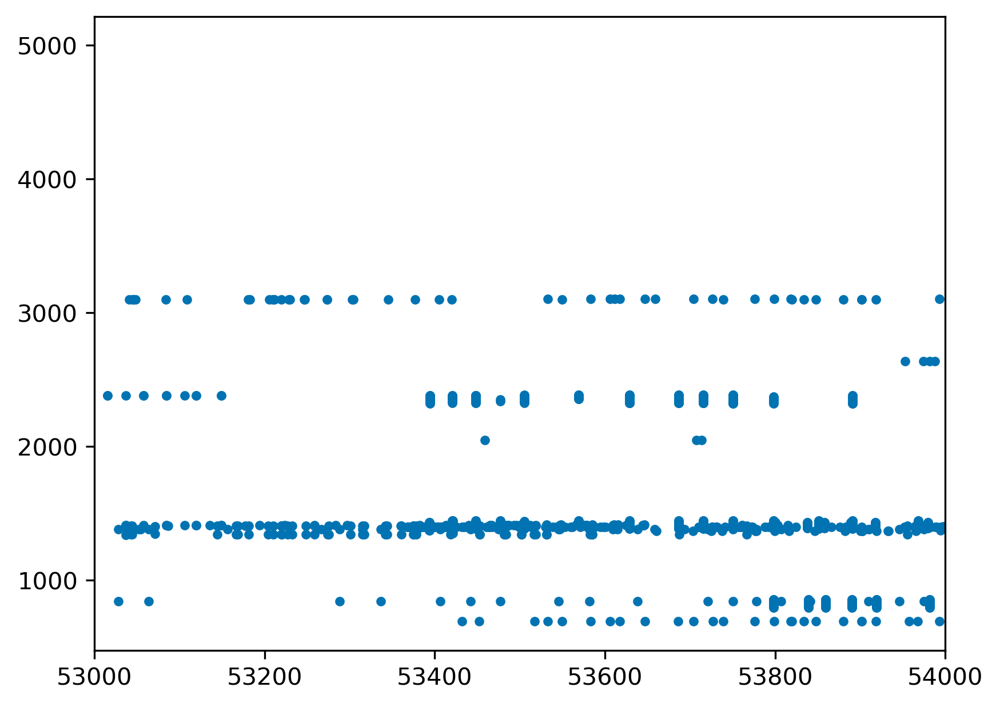

In [25]:
psr = [p for p in psrs['combined'] if p.name == 'J1713+0747'][0]
plt.plot(psr.toas/const.day, psr.freqs, '.')
plt.xlim([53000, 54000])
plt.show()

In [28]:
ptas

['EPTA', 'NANOGrav', 'PPTA']

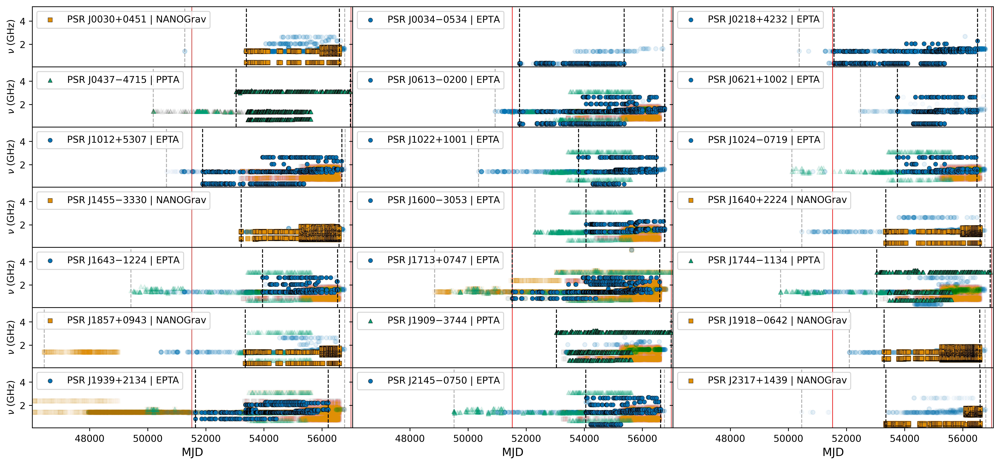

In [46]:
markers = ['o', 's', '^']
mint_lc = np.min([psr.toas.min() for psr in psrs['combined']])/const.day
maxt_lc = np.max([psr.toas.max() for psr in psrs['combined']])/const.day
mint_lite = np.min([psr.toas.min() for psr in psrs['single-PTA']])/const.day
maxt_lite = np.max([psr.toas.max() for psr in psrs['single-PTA']])/const.day
Npsrs = len(psrnames)
fig, axes = plt.subplots(7, 3, figsize=(15,7), dpi=600, sharey=True)
axes = np.array(axes).flatten()
for idx, psrname in enumerate(psrnames):
    ax = axes[idx]
    psr = [p for p in psrs['combined'] if p.name == psrname][0]
    psrlite = [p for p in psrs['single-PTA'] if p.name == psrname][0]
    for i, pta in enumerate(ptas):
        if pta in psr.flags['pta']:
            if psrname == 'J1939+2134' and pta == 'NANOGrav':
                nix = psr.flags['pta'] == pta
                nix1 = nix*(psr.toas/const.day < 52000)
                ax.scatter(psr.toas[nix1]/const.day, psr.freqs[nix1]/1e3,
                           color=f'C{i}', alpha=0.02, s=20, marker=markers[i])
                nix2 = nix*(psr.toas/const.day > 52000)
                ax.scatter(psr.toas[nix2]/const.day, psr.freqs[nix2]/1e3,
                           color=f'C{i}', alpha=0.1*beta[psrname][pta], s=20, marker=markers[i])
            elif psrname == 'J1713+0747' and pta == 'NANOGrav':
                nix = psr.flags['pta'] == pta
                nix1 = nix*(psr.toas/const.day < 53200)
                ax.scatter(psr.toas[nix1]/const.day, psr.freqs[nix1]/1e3,
                           color=f'C{i}', alpha=0.05, s=20, marker=markers[i])
                nix2 = nix*(psr.toas/const.day > 53200)
                ax.scatter(psr.toas[nix2]/const.day, psr.freqs[nix2]/1e3,
                           color=f'C{i}', alpha=0.1*beta[psrname][pta], s=20, marker=markers[i])
            else:
                nix = psr.flags['pta'] == pta
                ax.scatter(psr.toas[nix]/const.day, psr.freqs[nix]/1e3,
                           color=f'C{i}', alpha=0.1*beta[psrname][pta], s=20, marker=markers[i])
    for i, pta in enumerate(ptas):
        if pta in psrlite.flags['pta']:
            ax.scatter(psrlite.toas/const.day, psrlite.freqs/1e3, color=f'C{i}', alpha=1,
                       label=f'PSR {psrname.replace("-",r"$-$")} | {pta}', edgecolor='k',
                       lw=0.3, s=20, marker=markers[i])
    ax.legend(loc='upper left', frameon=True)
    ax.axvline(mint_lite, color='r', alpha=1, lw=0.6, ls='-')
    ax.axvline(maxt_lite, color='r', alpha=1, lw=0.6, ls='-')
    ax.axvline(psrlite.toas.min()/const.day, color='k', alpha=1, lw=1, ls='--')
    ax.axvline(psrlite.toas.max()/const.day, color='k', alpha=1, lw=1, ls='--')
    ax.axvline(psr.toas.min()/const.day, color='k', alpha=0.3, lw=1, ls='--')
    ax.axvline(psr.toas.max()/const.day, color='k', alpha=0.3, lw=1, ls='--')
    if idx % 3 == 0:
        ax.set_ylabel(r'$\nu$ (GHz)')
    ax.set_xlim([mint_lc, maxt_lc])
    #plt.title(psrname)
#fig.delaxes(axes[-1])
#axes[-2].set_xlim([mint_lc, maxt_lc])
axes[-1].set_xlabel('MJD', fontsize='large')
axes[-2].set_xlabel('MJD', fontsize='large')
axes[-3].set_xlabel('MJD', fontsize='large')
#axes.get_shared_x_axes().remove(axes[-3])
#axes[-3].set_xticks([46000, 48000, 50000, 52000, 54000, 56000, 58000])
#axes[-3].set_xticklabels(['46000', '48000', '50000', '52000', '54000', '56000', '58000'])
#axes[-3].xaxis.set_visible(True)
#plt.label_outer()
fig.tight_layout()
fig.subplots_adjust(hspace=0, wspace=0)
fig.savefig(f'{figsave}/compare_toas.png', dpi=600, bbox_inches='tight')
plt.show()

In [26]:
(maxt_lc - mint_lc)*const.day/const.yr

30.19071113233252

In [27]:
(maxt_lite - mint_lite)*const.day/const.yr

14.989485382526238

In [29]:
np.sqrt(2)

1.4142135623730951

In [30]:
65-21

44

In [31]:
53-21

32

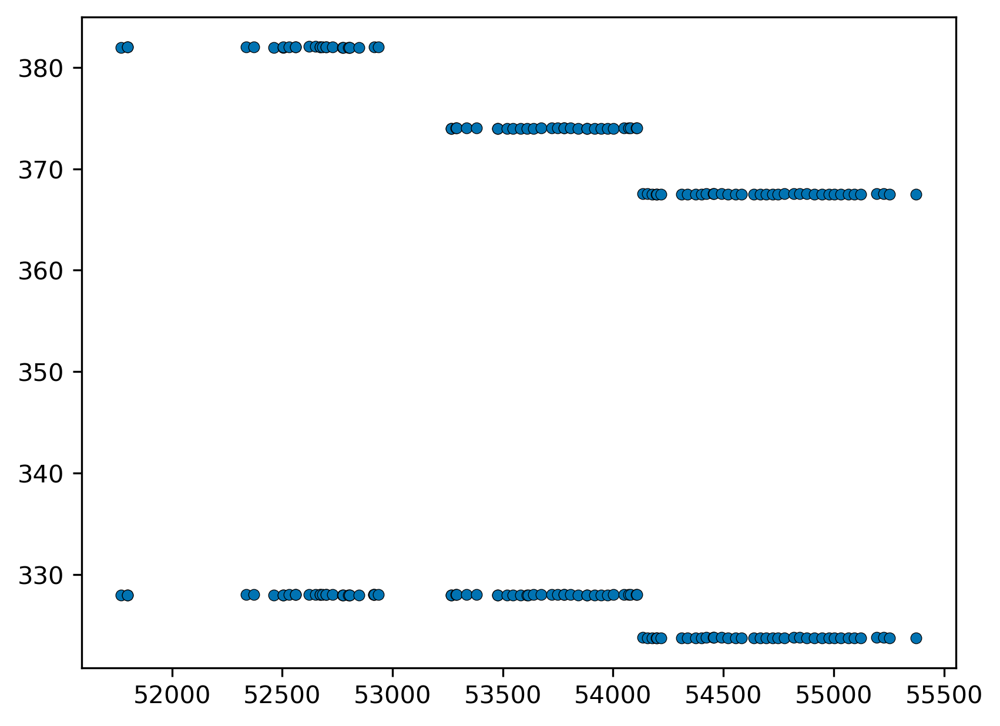

In [17]:
psrname = 'J0034-0534'
pta = 'EPTA'
psr = [p for p in psrs['single-PTA'] if p.name == psrname][0]
plt.scatter(psr.toas/const.day, psr.freqs, color=f'C0', alpha=1, edgecolor='k',
            lw=0.3, s=20, marker='o')

In [20]:
np.unique(psr.flags['group'])

array(['WSRT.P1.328', 'WSRT.P1.328.C', 'WSRT.P1.382', 'WSRT.P1.382.C'],
      dtype='<U13')

In [21]:
382/328

1.1646341463414633

In [101]:
maxt

57051.955677141625